# AIHub 인도보행 서브셋 — 이미지 · BBox 눈으로 확인

> 대상: `data/bammasil_aihub_subset` (AI Hub 「인도보행 영상」에서 113,163장 추출·변환)
> 클래스: `0 person` · `1 stairs` · `2 bollard`

라벨이 이미지 위에 제대로 얹히는지, 박스가 실제로 무엇을 가리키는지 **표로는 알 수 없는 것**을
확인한다. 학습에 넣기 전 육안 검수용.

## 읽기 전 알아둘 것 (패키지 README 요약)

1. **`is_night`·`hour` 컬럼은 무효다.** 파일 mtime 을 촬영시각으로 가정했으나 실제로는 추출·복사
   시각이었다. 실측 조도 기준 야간은 220장/37,961장(**0.58%**) 뿐이다. 블록 이름의
   `_night`/`_day` 도 같은 이유로 믿지 말 것 — **part1/part2 는 제작 순서 분할일 뿐이다.**
2. **`stairs` 는 이 패키지에 없다.** AIHub 인도보행에 계단 클래스가 없어 StairNet 이 유일 공급원.
   따라서 아래 시각화에서 클래스 1 은 한 장도 나오지 않는 것이 정상이다.
3. **볼라드는 구조적으로 작다** — 640 환산 폭 중앙값 7.8px, 8px 미만이 50.3%.
   YOLO11 최소 stride 가 8 이므로 절반은 특징맵 한 칸도 못 채운다. 5절에서 이 박스들을 따로 본다.

In [2]:
import random
import sys
from pathlib import Path

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import patches
from PIL import Image

# 한국어 Windows 콘솔(cp949) 대비. Jupyter 커널의 OutStream 에는 reconfigure 가 없다.
if hasattr(sys.stdout, "reconfigure"):
    sys.stdout.reconfigure(errors="replace")

ROOT = Path.cwd().parent
assert (ROOT / "scripts").is_dir(), f"작업 디렉토리를 notebooks/ 로 둘 것 (현재: {Path.cwd()})"

SUBSET = ROOT / "data/bammasil_aihub_subset"
CLASS_NAMES = ["person", "stairs", "bollard"]
CLASS_COLORS = {0: "#4EA8FF", 1: "#FFD23B", 2: "#FF5C5C"}
SEED = 0

# 이미지 폴더(*_images-00N)와 라벨 폴더(*_labels)는 따로 압축돼 있다. 블록 이름으로 짝짓는다.
BLOCKS = {}
for img_root in sorted(SUBSET.glob("*_images-*")):
    lbl_root = SUBSET / (img_root.name.split("_images-")[0] + "_labels")
    for gdir in sorted(p for p in img_root.iterdir() if p.is_dir()):
        BLOCKS[gdir.name] = (gdir / "images", lbl_root / gdir.name / "labels")

print(f"{'블록':<16}{'이미지':>9}{'라벨':>9}")
for g, (idir, ldir) in BLOCKS.items():
    n_img = sum(1 for _ in idir.glob("*.jpg"))
    n_lbl = sum(1 for _ in ldir.glob("*.txt"))
    flag = "" if n_img == n_lbl else "   <-- 개수 불일치"
    print(f"{g:<16}{n_img:>9,}{n_lbl:>9,}{flag}")

블록                    이미지       라벨
bollard_night      12,806   12,806
negative_night      3,451    3,451
person_night       21,704   21,704
bollard_day        75,202   75,202


## 1. manifest 로 본 블록 구성

`manifest.csv` 가 패키지의 정의다 — 이미지 폴더를 통째로 glob 하는 대신 이쪽을 기준으로 삼는다.
`n_person`·`n_bollard` 는 변환 시점에 센 박스 수라, 라벨 파일을 다 열지 않고도 분포를 볼 수 있다.

In [3]:
MAN = pd.concat(
    [pd.read_csv(csv).assign(part=csv.parent.name.split("_")[2])
     for csv in sorted(SUBSET.glob("*_labels/manifest*.csv"))],
    ignore_index=True,
)

summary = (MAN.groupby(["part", "group"])
             .agg(장수=("out_name", "size"),
                  person박스=("n_person", "sum"),
                  bollard박스=("n_bollard", "sum"),
                  세션수=("src_sequence", "nunique"))
             .reset_index())
display(summary)

print("\n원본 해상도 (실픽셀 크기를 볼 때 단일 해상도를 가정하면 안 된다)")
print(MAN.groupby(["orig_width", "orig_height"]).size().rename("장수").to_frame())

,part,group,장수,person박스,bollard박스,세션수
0,part1,bollard_night,12806,34019,42397,1305
1,part1,negative_night,3451,0,0,521
2,part1,person_night,21704,71625,0,1721
3,part2,bollard_day,75202,96673,250955,2116



원본 해상도 (실픽셀 크기를 볼 때 단일 해상도를 가정하면 안 된다)
                            장수
orig_width orig_height        
1920       1080         112689
3328       1872            470
4096       2304              4


## 2. 이미지·라벨 로더

- `cv2.imread` 는 비ASCII 경로를 예외 없이 `None` 으로 반환한다 → `imdecode` 로 우회한다
  (`data/AIHub인도보행영상…` 같은 경로에서 실제로 물렸던 함정).
- 라벨은 YOLO 형식 `class cx cy w h` (정규화). negative 블록은 **빈 파일**이므로 0박스로 다룬다.

In [4]:
def load_image(path):
    """비ASCII 경로에서도 읽히는 RGB 로더."""
    img = cv2.imdecode(np.fromfile(path, dtype=np.uint8), cv2.IMREAD_COLOR)
    if img is None:
        raise FileNotFoundError(path)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


def load_labels(path):
    """(N, 5) = class, cx, cy, w, h — 정규화 좌표. 파일이 없거나 비면 (0, 5)."""
    if not path.exists():
        return np.zeros((0, 5), dtype=float)
    rows = [ln.split() for ln in path.read_text().splitlines() if ln.strip()]
    return np.array(rows, dtype=float).reshape(-1, 5)


def pick(group, n=6, need_class=None, min_boxes=0, seed=SEED):
    """블록에서 조건에 맞는 (이미지경로, 라벨) 을 n 개 뽑는다."""
    img_dir, lbl_dir = BLOCKS[group]
    files = sorted(img_dir.glob("*.jpg"))
    random.Random(seed).shuffle(files)
    out = []
    for f in files:
        lab = load_labels(lbl_dir / f"{f.stem}.txt")
        if len(lab) < min_boxes:
            continue
        if need_class is not None and not (lab[:, 0] == need_class).any():
            continue
        out.append((f, lab))
        if len(out) >= n:
            break
    return out


def draw(ax, img, lab, title=None, small_px=None):
    """정규화 라벨을 이미지 위에 그린다. small_px 미만 폭의 박스는 점선으로 구분."""
    h, w = img.shape[:2]
    ax.imshow(img)
    ax.set_axis_off()
    for cls, cx, cy, bw, bh in lab:
        px = bw * w
        dashed = small_px is not None and px < small_px
        ax.add_patch(patches.Rectangle(
            ((cx - bw / 2) * w, (cy - bh / 2) * h), bw * w, bh * h,
            fill=False, edgecolor=CLASS_COLORS[int(cls)],
            linewidth=1.4, linestyle=":" if dashed else "-"))
    if title:
        ax.set_title(title, fontsize=8, loc="left")


def show_grid(items, ncols=3, width=4.6, small_px=None):
    n = len(items)
    if n == 0:
        print("조건에 맞는 이미지가 없다.")
        return
    nrows = (n + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(width * ncols, width * 0.62 * nrows))
    axes = np.ravel(np.atleast_1d(axes))
    for ax, (f, lab) in zip(axes, items):
        cnt = {CLASS_NAMES[c]: int((lab[:, 0] == c).sum()) for c in np.unique(lab[:, 0]).astype(int)}
        draw(ax, load_image(f), lab, title=f"{f.stem[-24:]}  {cnt or '(no box)'}", small_px=small_px)
    for ax in axes[n:]:
        ax.set_axis_off()
    handles = [patches.Patch(color=CLASS_COLORS[c], label=f"{c} {CLASS_NAMES[c]}") for c in (0, 1, 2)]
    fig.legend(handles=handles, loc="lower center", ncol=3, frameon=False)
    fig.tight_layout(rect=(0, 0.03, 1, 1))
    plt.show()

## 3. 블록별 샘플

각 블록에서 무작위로 뽑아 라벨을 얹는다. `SEED` 를 바꾸면 다른 표본이 나온다.
`negative_night` 은 **박스가 없는 것이 정상**이다 — 사람도 볼라드도 없는 배경 표본이라
"사람=배경" 을 가르치지 않도록 일부러 넣은 블록이다.

=== bollard_night ===


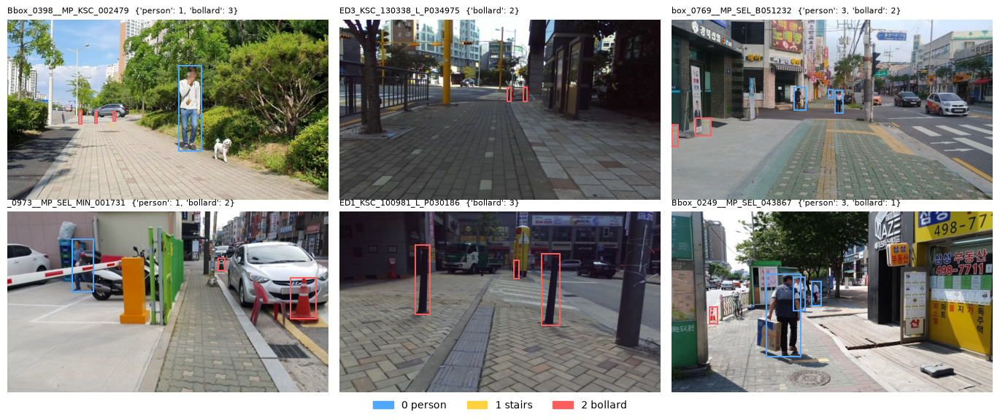

=== negative_night ===


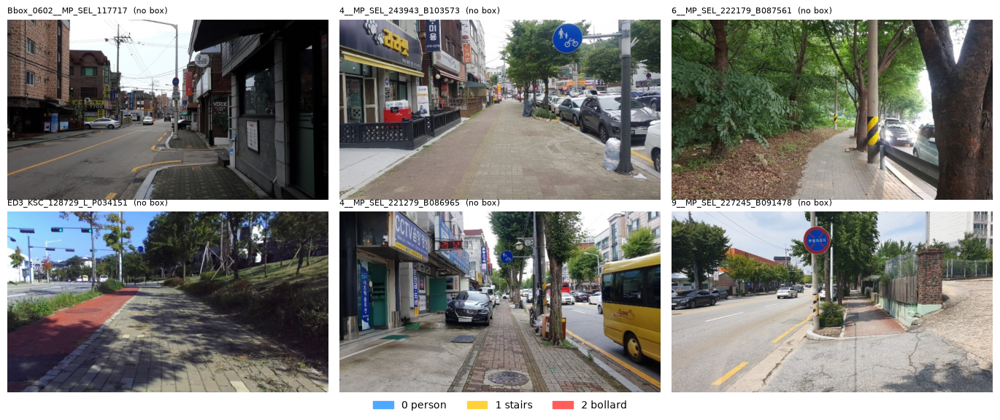

=== person_night ===


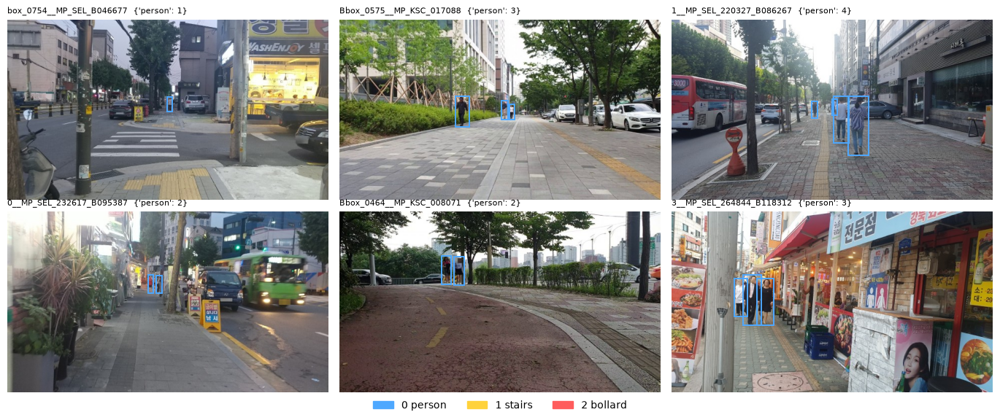

=== bollard_day ===


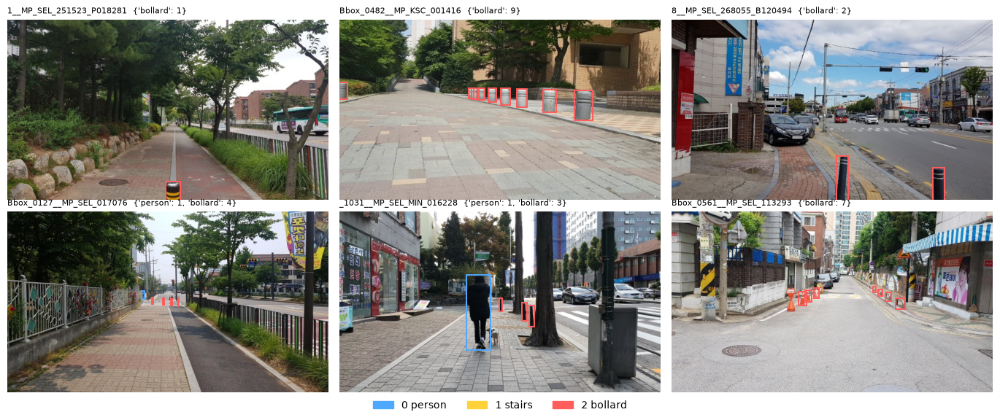

In [5]:
for group in BLOCKS:
    print(f"=== {group} ===")
    show_grid(pick(group, n=6), ncols=3)

## 4. 클래스별로 확실히 보기

무작위 표본은 person 이 압도적이라(202K vs 293K 이지만 장당 분포가 다르다) 볼라드가 묻힌다.
클래스를 지정해 뽑는다.

=== person 이 많은 장면 (person 박스 5개 이상) ===


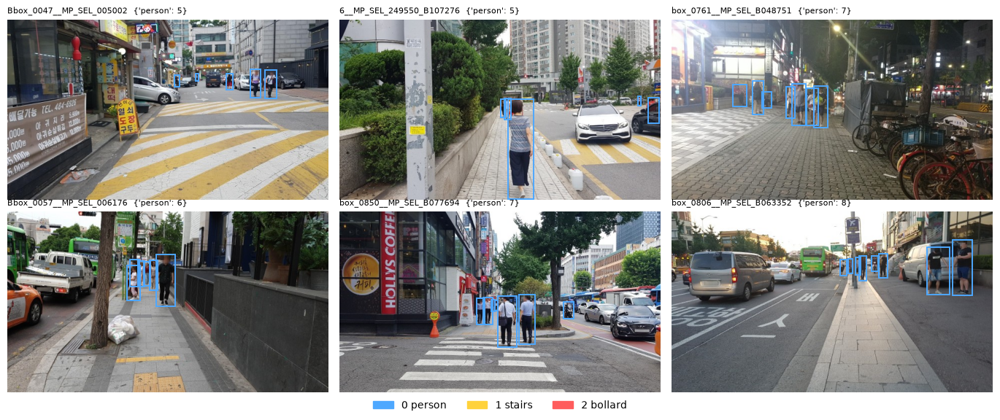

=== bollard 가 있는 장면 ===


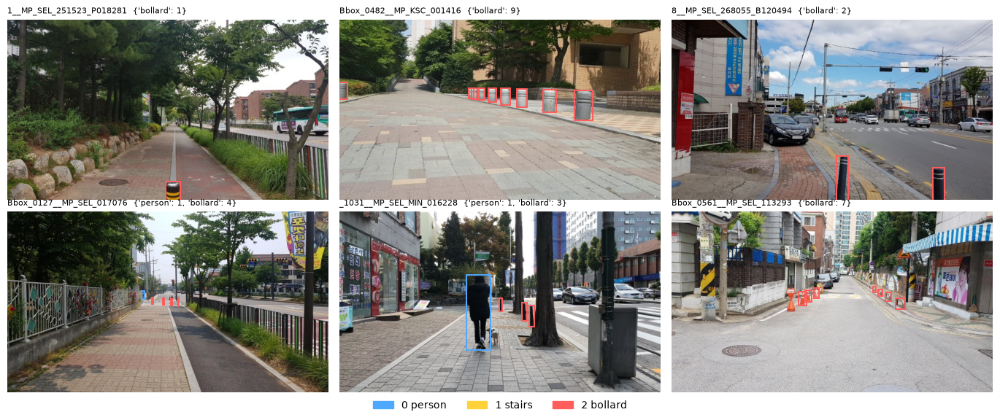

In [6]:
print("=== person 이 많은 장면 (person 박스 5개 이상) ===")
show_grid(pick("person_night", n=6, need_class=0, min_boxes=5), ncols=3)

print("=== bollard 가 있는 장면 ===")
show_grid(pick("bollard_day", n=6, need_class=2), ncols=3)

## 5. 볼라드가 얼마나 작은가 — 탐지 하한과 겹쳐 보기

이미지는 **긴 변 640 으로 리사이즈**돼 있으므로 저장된 픽셀 폭이 곧 640 입력 환산 폭이다.
점선 = 폭 8px 미만 (YOLO11 최소 stride). **박스가 특징맵 한 칸도 못 채우는 구간**이라,
낮은 recall 이 나와도 "데이터 부족" 이 아니라 **해상도 한계**일 수 있다.
평가할 때 단일 mAP 대신 크기 구간별 recall 을 함께 뽑아야 하는 이유가 여기 있다.

표본 볼라드 973박스 (640 환산 폭)
  p5      2.4px
  p25     4.0px
  p50     7.2px
  p75    13.5px
  p95    35.3px
  8px 미만 55.3%   4px 미만 25.2%
  (README 전수: p50 7.8px · 8px 미만 50.3% · 4px 미만 28.0%)

=== 작은 볼라드가 실제로 어떻게 생겼는가 (점선 = 8px 미만) ===


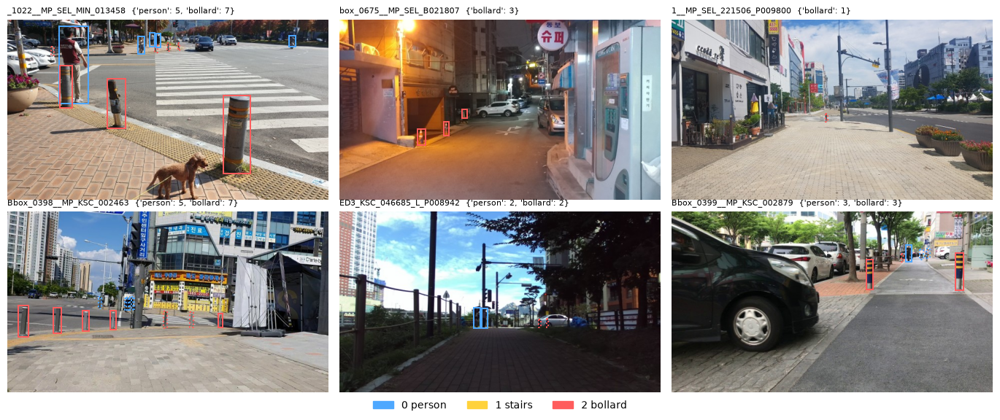

In [7]:
STRIDE = 8

# 표본에서 볼라드 폭 분포를 직접 재 본다 (README 의 전수 수치와 대조용).
# 폭만 필요하므로 디코드하지 않고 PIL 로 헤더의 크기만 읽는다.
widths = []
for f, lab in pick("bollard_day", n=300, need_class=2, seed=SEED):
    w = Image.open(f).size[0]
    widths.extend(lab[lab[:, 0] == 2][:, 3] * w)
widths = np.array(widths)

print(f"표본 볼라드 {len(widths):,}박스 (640 환산 폭)")
for q in (5, 25, 50, 75, 95):
    print(f"  p{q:<3} {np.percentile(widths, q):6.1f}px")
print(f"  {STRIDE}px 미만 {100 * (widths < STRIDE).mean():.1f}%   4px 미만 {100 * (widths < 4).mean():.1f}%")
print("  (README 전수: p50 7.8px · 8px 미만 50.3% · 4px 미만 28.0%)")

print("\n=== 작은 볼라드가 실제로 어떻게 생겼는가 (점선 = 8px 미만) ===")
show_grid(pick("bollard_day", n=6, need_class=2, seed=SEED + 1), ncols=3, small_px=STRIDE)

## 6. 한 장 크게 보기

의심스러운 장면을 파일명으로 지정해 확대한다. `pick()` 이 찍어 준 이름 뒤 24자를 그대로 넣어도 되고,
전체 stem 을 넣어도 된다.

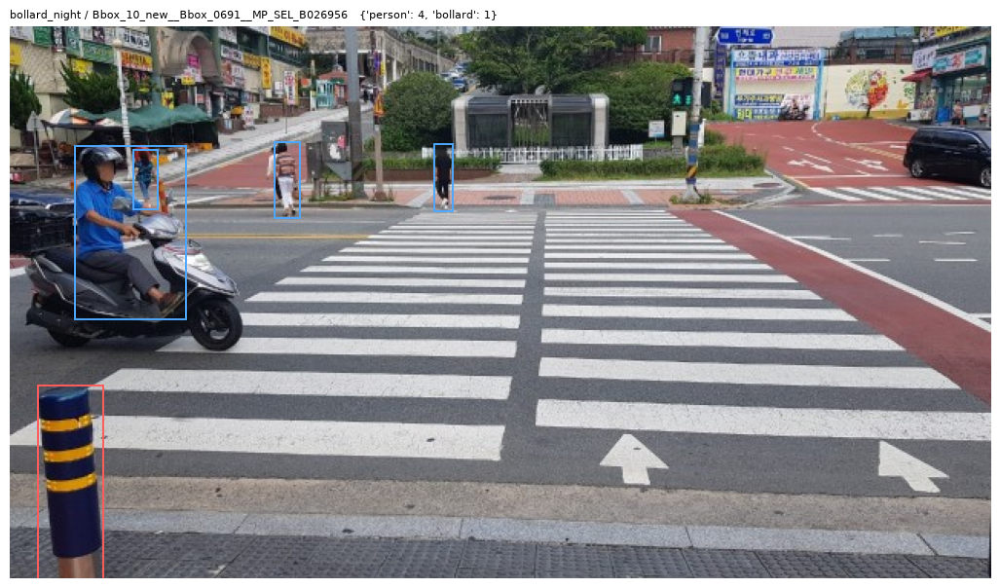

In [8]:
def show_one(group, name_part, figsize=(13, 8), small_px=STRIDE):
    """파일명 일부로 한 장을 찾아 크게 그린다."""
    img_dir, lbl_dir = BLOCKS[group]
    hits = [p for p in img_dir.glob(f"*{name_part}*.jpg")]
    if not hits:
        raise FileNotFoundError(f"{group} 에 '{name_part}' 없음")
    f = hits[0]
    lab = load_labels(lbl_dir / f"{f.stem}.txt")
    fig, ax = plt.subplots(figsize=figsize)
    cnt = {CLASS_NAMES[c]: int((lab[:, 0] == c).sum()) for c in np.unique(lab[:, 0]).astype(int)}
    draw(ax, load_image(f), lab, title=f"{group} / {f.stem}   {cnt}", small_px=small_px)
    plt.show()
    return f


# 예시 — bollard_night 첫 장
first = sorted(BLOCKS["bollard_night"][0].glob("*.jpg"))[0]
show_one("bollard_night", first.stem);

## 7. 밝기 — "야간" 이라는 이름이 맞는지 직접 확인

블록 이름과 `is_night` 을 믿지 말라고 했으니, 표본의 평균 휘도를 직접 잰다.
패키지 README 의 기준(평균휘도 60 미만 = 야간)으로 세어 보면 어느 블록이든
야간은 거의 나오지 않는다 — **이 데이터로 야간 평가셋을 만들 수 없다**는 근거다.

블록                  표본      평균휘도      p5    <60 비율
bollard_night      120     107.5    78.3      0.0%
negative_night     120      96.4    74.9      0.0%
person_night       120     108.8    79.6      0.0%
bollard_day        120     114.0    82.5      0.8%


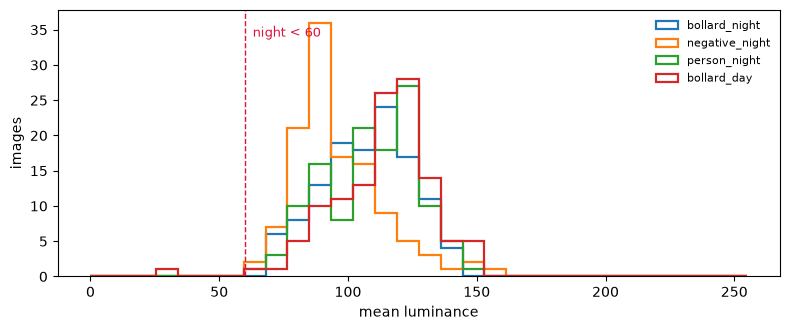

In [9]:
NIGHT_TH = 60          # README 실측 기준
N_SAMPLE = 120

LUM = {}
for group, (idir, _) in BLOCKS.items():
    files = sorted(idir.glob("*.jpg"))
    random.Random(SEED).shuffle(files)
    LUM[group] = np.array([cv2.cvtColor(load_image(f), cv2.COLOR_RGB2GRAY).mean()
                           for f in files[:N_SAMPLE]])

print(f"{'블록':<16}{'표본':>6}{'평균휘도':>10}{'p5':>8}{'<60 비율':>10}")
for group, lum in LUM.items():
    print(f"{group:<16}{len(lum):>6}{lum.mean():>10.1f}"
          f"{np.percentile(lum, 5):>8.1f}{100 * (lum < NIGHT_TH).mean():>9.1f}%")

fig, ax = plt.subplots(figsize=(8, 3.4))
for group, lum in LUM.items():
    ax.hist(lum, bins=30, range=(0, 255), histtype="step", linewidth=1.6, label=group)
ax.axvline(NIGHT_TH, color="crimson", linestyle="--", linewidth=1)
ax.text(NIGHT_TH + 3, ax.get_ylim()[1] * 0.9, f"night < {NIGHT_TH}", color="crimson", fontsize=9)
ax.set_xlabel("mean luminance"); ax.set_ylabel("images"); ax.legend(fontsize=8, frameon=False)
fig.tight_layout(); plt.show()